In [40]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [1]:
#Libraries to import
import pandas as pd
import numpy as np
import hvplot.pandas
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import datetime


Bad key "text.kerning_factor" on line 4 in
C:\Users\Robel\anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


# Bring in Bitcoin Data and Elon's Tweet Data

In [2]:
#Plotting Bitcoins Trajectory - 
#Skip the first Row of CSV file and drop the UNIX Time Stamp column and unnecessary Symbol column 
BTC_hour = pd.read_csv('Data/gemini_BTCUSD_1hr.csv', skiprows=1).drop(columns=['Unix Timestamp','Symbol'])

#Bring in BTCUSD_day
BTC_day = pd.read_csv('Data/gemini_BTCUSD_day.csv', skiprows=1).drop(columns=['Unix Timestamp','Symbol'])

#Convert Date to datetime
BTC_day['Date'] = pd.to_datetime(BTC_day['Date'],utc=True)
BTC_hour['Date'] = pd.to_datetime(BTC_hour['Date'],utc=True)


#Make Date index -> Clean up Data
BTC_day.set_index('Date', inplace=True)
BTC_hour.set_index('Date',inplace=True)

#Sort BTC Index
BTC_hour.sort_index(ascending=True,inplace=True)

BTC_day.head()
BTC_hour.head()

,Open,High,Low,Close,Volume
Date,,,,,
2015-10-08 13:00:00+00:00,0.00,245.00,0.00,245.00,0.606654
2015-10-08 14:00:00+00:00,245.00,245.00,244.50,245.00,4.453649
2015-10-08 15:00:00+00:00,245.00,245.00,244.92,244.92,3.016926
2015-10-08 16:00:00+00:00,244.92,244.92,244.25,244.25,3.895252
2015-10-08 17:00:00+00:00,244.25,244.99,244.02,244.99,3.920632


In [3]:
#Bring in ALL of Elon Musks Tweets
tweets_elonmusk_all = pd.read_csv('Data/tweets_elonmusk_all_CLEAN.csv')
#Bring in and group Elon Musk Tweets about Crypto/Bitcoin
tweets_elonmusk_crypto = pd.read_csv('Data/tweets_elonmusk_crypto_CLEAN.csv')

#Convert tweet_date to datetime
tweets_elonmusk_all['tweet_date'] = pd.to_datetime(tweets_elonmusk_all['tweet_date'],utc=True)
tweets_elonmusk_crypto['tweet_date'] = pd.to_datetime(tweets_elonmusk_crypto['tweet_date'],utc=True)

#Round the tweets to the nearest hour
tweets_elonmusk_all['tweet_date'] = tweets_elonmusk_all['tweet_date'].dt.round('60min')
tweets_elonmusk_crypto['tweet_date'] = tweets_elonmusk_crypto['tweet_date'].dt.round('60min')


tweets_elonmusk_all.head()

,twitter_username,twitter_account,tweet_date,tweet_content,tweet_reply_count,tweet_retweet_count,tweet_like_count
0,Elon Mus00,@elonmus00,2021-03-13 00:00:00+00:00,replying to \n@ashleevancefor sure wise for el...,2500,1300,800
1,Elon Mus00,@elonmus00,2021-03-13 00:00:00+00:00,fsd beta has now been expanded to ~2000 owners...,1300,1700,19500
2,Elon Mus00,@elonmus00,2021-03-12 23:00:00+00:00,replying to \n@pflodin\n and \n@doctor00arlabs...,87,67,1400
3,Elon Mus00,@elonmus00,2021-03-12 19:00:00+00:00,both do mining & use bloc00s & chains,2900,4300,96400
4,Elon Mus00,@elonmus00,2021-03-12 19:00:00+00:00,btc (bitcoin) is an anagram of\ntbc(the boring...,11700,19600,234200


In [4]:
#Make tweet_date the index and sort index
EMT = tweets_elonmusk_crypto.set_index('tweet_date').sort_index(ascending=True) #EMT - Elon Musk Tweets with the tweet_date set as the index
tweets_elonmusk_crypto.sort_index(ascending=False,inplace=True)

# Plot Elon's Crypto Tweet Profile

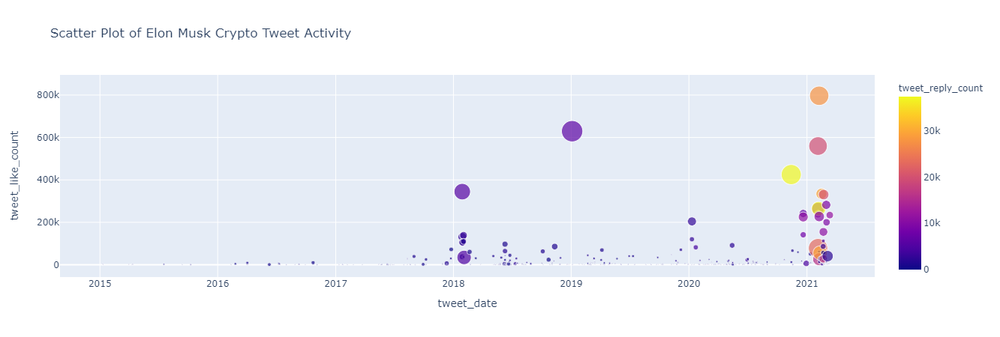

<Figure size 432x288 with 0 Axes>

In [5]:
#Plot the likes by day - scatter plot
fig = plt.figure()
fig = px.scatter(tweets_elonmusk_crypto,x='tweet_date',y='tweet_like_count',size='tweet_retweet_count', color='tweet_reply_count', title = 'Scatter Plot of Elon Musk Crypto Tweet Activity')
fig.write_image('Images/Scatter_Plot_Tweet_Activity.png')
fig.show()

In [7]:
#Filter out the hours when Elon tweeted
filtered_BTC = EMT.merge(BTC_hour, left_on='tweet_date', right_index=True)
filtered_BTC.head()

,twitter_username,twitter_account,tweet_content,tweet_reply_count,tweet_retweet_count,tweet_like_count,Open,High,Low,Close,Volume
tweet_date,,,,,,,,,,,
2015-10-09 05:00:00+00:00,Elon Musk,@elonmusk,peak temp increases due to climate changethe s...,86,784,981,243.60,243.60,243.60,243.60,0.000000
2016-02-11 07:00:00+00:00,Elon Musk,@elonmusk,replying to \n@garethseneque@garethseneque\n g...,9,21,162,378.62,378.74,378.50,378.50,10.801489
2016-02-24 17:00:00+00:00,Elon Mus00,@elonmus00,worth reposting the wait but why piece on ai w...,213,2400,4300,421.85,422.85,421.85,422.85,45.127719
2016-03-31 21:00:00+00:00,Elon Mus00,@elonmus00,replying to \n@elonmus00model 3 orders00 wheth...,186,605,1500,416.60,416.94,416.60,416.93,1.297414
2016-04-01 18:00:00+00:00,Elon Mus00,@elonmus00,definitely going to need to rethin00 productio...,717,3100,9100,416.00,416.08,416.00,416.08,31.921884


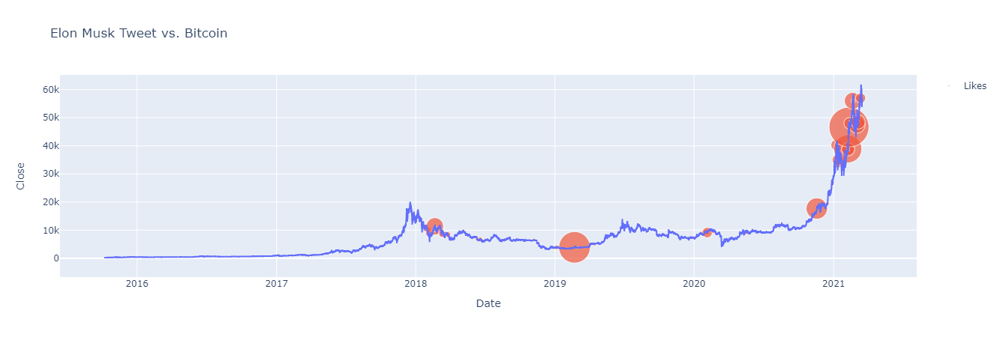

In [8]:
#Plot the likes size over the BTC value
#Plot BTC
fig = px.line(BTC_hour, x=BTC_hour.index, y='Close', title='Elon Musk Tweet vs. Bitcoin')

#Add a scatter plot, but the x and y corrdinates of likes in bubbles
fig.add_trace(go.Scatter(x=filtered_BTC.index,y=filtered_BTC['Close'], mode='markers',name='Likes',marker=dict(size=tweets_elonmusk_crypto['tweet_like_count']/15000)))

#Save the plot
fig.write_image('Images/Bitcoin_Data.png')

#Show plot
fig.show()

# Bitcoin Analysis

In [9]:
#Get daily retruns of BTC
daily_returns = BTC_day.pct_change().dropna()
daily_returns['Volume'] = daily_returns[daily_returns['Volume']<1000]
daily_returns.head()

,Open,High,Low,Close,Volume
Date,,,,,
2021-03-14 04:00:00+00:00,0.016444,0.015509,0.076007,0.081546,0.016444
2021-03-13 04:00:00+00:00,-0.075771,0.004621,-0.041966,0.016444,-0.075771
2021-03-12 04:00:00+00:00,0.007156,-0.061921,-0.021933,-0.075771,0.007156
2021-03-11 04:00:00+00:00,-0.019960,0.002774,-0.013956,0.007156,-0.019960
2021-03-10 04:00:00+00:00,-0.044764,-0.012388,-0.022710,-0.019960,-0.044764


In [10]:
#Plot out daily returns
daily_returns['Close'].hvplot(width=1400,height=600, title='Bitcoin Daily Returns')

:Curve   [Date]   (Close)

In [11]:
#Group tweets day by day
tweets_elonmusk_crypto_daily = tweets_elonmusk_crypto.set_index('tweet_date').groupby(pd.Grouper(freq='D')).mean().dropna()
tweets_elonmusk_crypto_daily.head()

,tweet_reply_count,tweet_retweet_count,tweet_like_count
tweet_date,,,
2015-01-10 00:00:00+00:00,421.0,200.0,2600.0
2015-03-31 00:00:00+00:00,496.0,100.0,1900.0
2015-04-11 00:00:00+00:00,59.0,117.0,517.0
2015-04-13 00:00:00+00:00,265.0,100.0,2300.0
2015-07-18 00:00:00+00:00,219.0,1100.0,2100.0


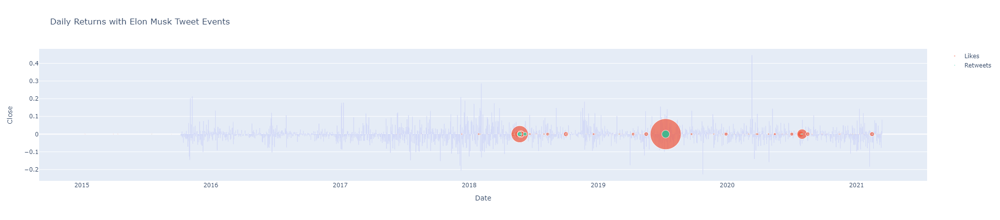

In [12]:
#Plot out Elon Musk tweet with daily returns - See if point of tweets correlate with High Daily returns

#Plot the likes size over the BTC value

#Plot BTC
fig = px.bar(daily_returns, x=daily_returns.index, y='Close', title='Daily Returns with Elon Musk Tweet Events')

#Add a scatter plot, but the x and y corrdinates of likes in bubbles
fig.add_trace(go.Scatter(x=tweets_elonmusk_crypto_daily.index,y=tweets_elonmusk_crypto_daily['tweet_like_count']*0, mode='markers',name='Likes', marker=dict(size=tweets_elonmusk_crypto['tweet_like_count']/10000)))

#Add a scatter plot, but the x and y corrdinates of retweet in bubbles
fig.add_trace(go.Scatter(x=tweets_elonmusk_crypto_daily.index,y=tweets_elonmusk_crypto_daily['tweet_retweet_count']*0, mode='markers',name='Retweets', marker=dict(size=tweets_elonmusk_crypto['tweet_retweet_count']/10000)))


#Show plot
fig.show()

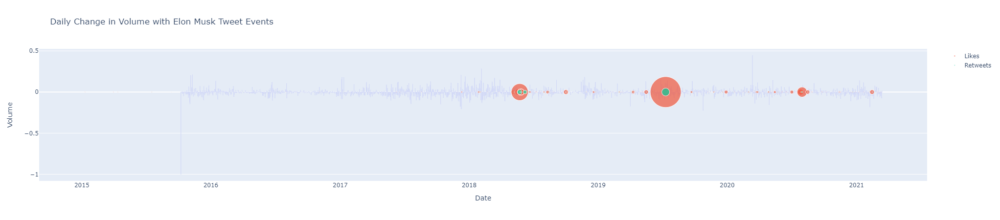

In [13]:
#Plot out Elon Musk tweet with daily returns - See if point of tweets correlate with High Daily returns

#Plot the likes size over the BTC value

#Plot BTC
fig = px.bar(daily_returns, x=daily_returns.index, y='Volume', title='Daily Change in Volume with Elon Musk Tweet Events')

#Add a scatter plot, but the x and y corrdinates of likes in bubbles
fig.add_trace(go.Scatter(x=tweets_elonmusk_crypto_daily.index,y=tweets_elonmusk_crypto_daily['tweet_like_count']*0, mode='markers',name='Likes', marker=dict(size=tweets_elonmusk_crypto['tweet_like_count']/10000)))

#Add a scatter plot, but the x and y corrdinates of retweet in bubbles
fig.add_trace(go.Scatter(x=tweets_elonmusk_crypto_daily.index,y=tweets_elonmusk_crypto_daily['tweet_retweet_count']*0, mode='markers',name='Retweets', marker=dict(size=tweets_elonmusk_crypto['tweet_retweet_count']/10000)))


#Show plot
fig.show()

# Elon Musk's Tweets Correlated with Bitcoin's Price Action

In [29]:
#Normalize Date portion of daily returns for daily_returns as daily dataframe
daily=daily_returns
daily.index = daily_returns.index.normalize()


#Combine daily_returns with Elon Musk Tweets Daily
daily_returns_and_elon_tweets = pd.concat([daily,tweets_elonmusk_crypto_daily],axis=1,join='inner')
daily_returns_and_elon_tweets.drop(columns=['Open','High','Low','Close','tweet_reply_count','tweet_retweet_count'],inplace=True)

In [30]:
#Correlate the two findings
correlation = daily_returns_and_elon_tweets.corr()
correlation

,Volume,tweet_like_count
Volume,1.000000,0.045157
tweet_like_count,0.045157,1.000000


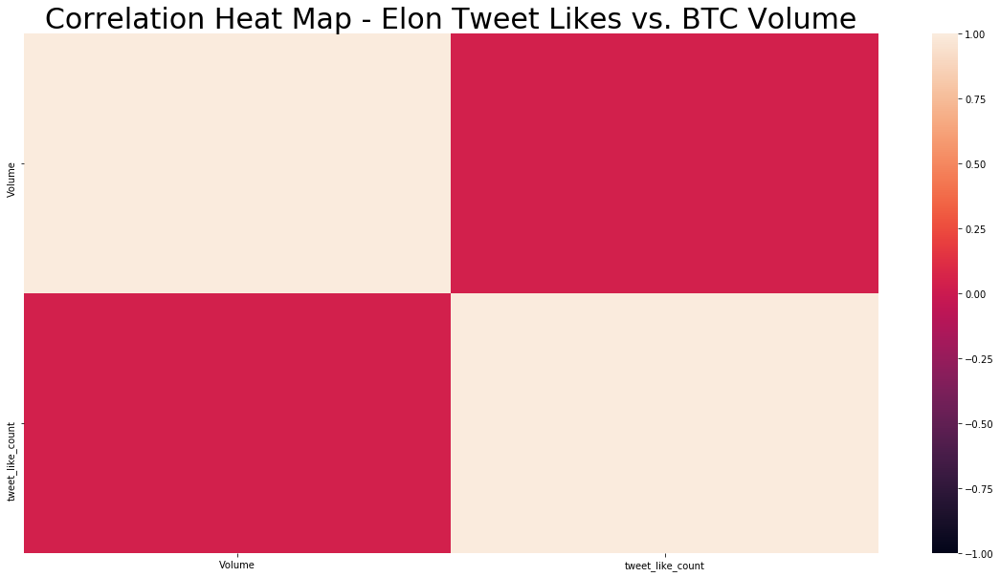

In [31]:
#Plot Correlation Plot
fig, ax = plt.subplots(figsize = (20,10))
ax.set_title('Correlation Heat Map - Elon Tweet Likes vs. BTC Volume',fontsize=30)
sns.heatmap(correlation,vmin=-1,vmax=1,ax=ax)#.title('Corr')
fig.savefig('Images/Heatmap_Volume.png')

In [32]:
#Group Elon's Tweet like count by day
elon_daily_tweet_count = tweets_elonmusk_all.set_index('tweet_date').groupby(pd.Grouper(freq='D')).sum()

#Drop all zeros
elon_daily_tweet_count.replace(0,np.nan,inplace=True)
elon_daily_tweet_count.dropna(inplace=True)
elon_daily_tweet_count.head()

,tweet_reply_count,tweet_retweet_count,tweet_like_count
tweet_date,,,
2015-01-05 00:00:00+00:00,456.0,4230.0,4097.0
2015-01-06 00:00:00+00:00,392.0,2245.0,1656.0
2015-01-10 00:00:00+00:00,2257.0,13848.0,13871.0
2015-01-15 00:00:00+00:00,763.0,6410.0,7081.0
2015-01-16 00:00:00+00:00,730.0,7874.0,8986.0


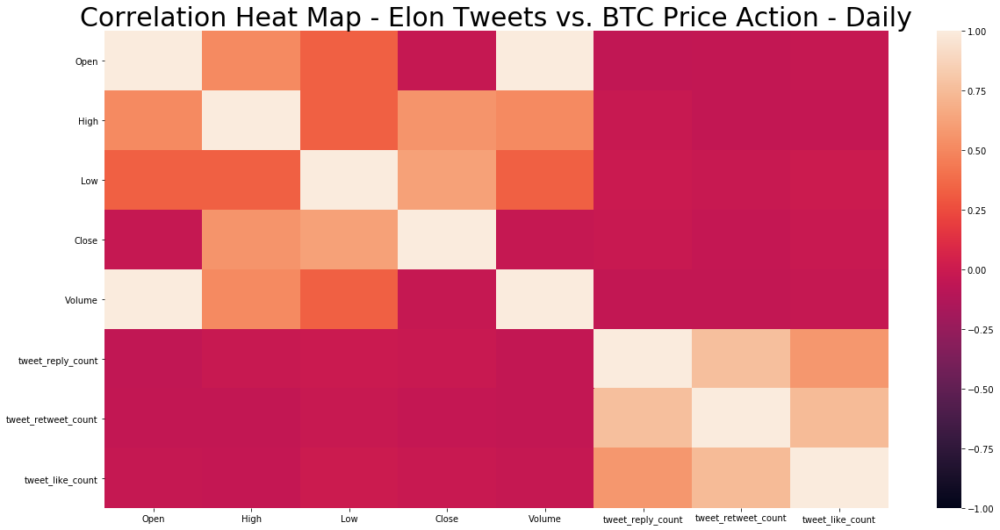

In [33]:
#Normalize Date portion of daily returns for daily_returns as daily dataframe
daily=daily_returns
daily.index = daily_returns.index.normalize()

#Combine daily_returns with Elon Musk Tweets Daily
daily_returns_and_elon_tweets = pd.concat([daily,elon_daily_tweet_count],axis=1,join='inner')
daily_returns_and_elon_tweets #.drop(columns=['Open','High','Low','Close','tweet_reply_count','tweet_retweet_count'],inplace=True)

#Correlate the two findings
correlation = daily_returns_and_elon_tweets.corr()
correlation

#Plot Correlation Plot
fig, ax = plt.subplots(figsize = (20,10))
ax.set_title('Correlation Heat Map - Elon Tweets vs. BTC Price Action - Daily',fontsize=30)
sns.heatmap(correlation,vmin=-1,vmax=1,ax=ax)
fig.savefig('Images/Heatmap_Daily.png')

In [19]:
#hourly returns
hourly_returns = BTC_hour.pct_change().dropna()
hourly_returns['Close'].hvplot(width=1400,height=600,title='Hourly Returns on Bitcoin')

:Curve   [Date]   (Close)

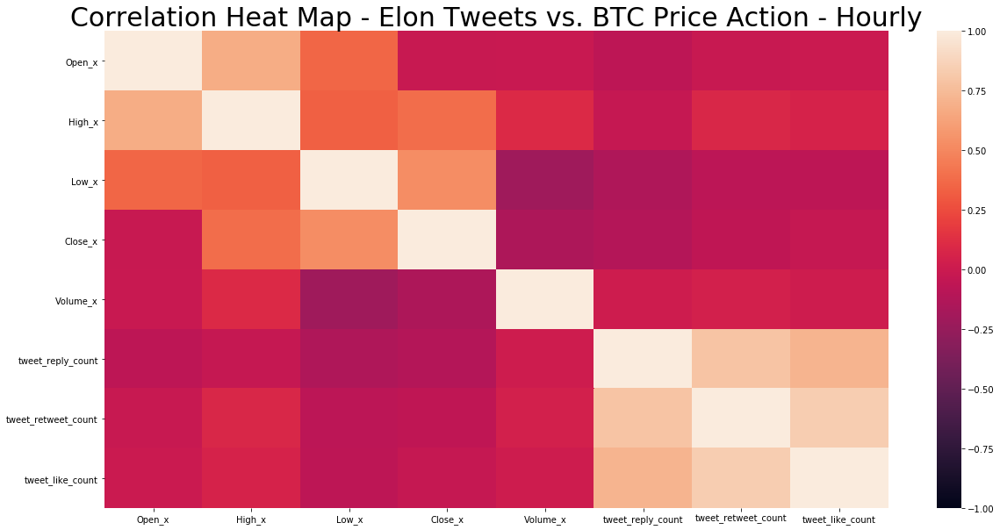

In [25]:
#Normalize Date portion of daily returns for hourly_returns as hourly dataframe
hourly=hourly_returns

#Combine daily_returns with Elon Musk Tweets Hourly
# = filtered_BTC#pd.concat([hourly,filtered_BTC],axis=1,join='inner')
hourly_returns_and_elon_tweets = hourly.merge(filtered_BTC, left_on='Date', right_index=True)
hourly_returns_and_elon_tweets.drop(columns=['Open_y','High_y','Low_y','Close_y','Volume_y','twitter_username','twitter_account','tweet_content'], inplace=True)
hourly_correlation = hourly_returns_and_elon_tweets.corr()

#Plot Correlation Plot
fig, ax = plt.subplots(figsize = (20,10))
ax.set_title('Correlation Heat Map - Elon Tweets vs. BTC Price Action - Hourly',fontsize=30)
sns.heatmap(hourly_correlation,vmin=-1,vmax=1,ax=ax)
fig.savefig('Images/Heatmap_Hourly.png')